In [1]:
import seaborn as sns
from rich import print, inspect, traceback, pretty
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

from chaotic_carbon_networks import matrix as ccnm
from chaotic_carbon_networks.preprocessing import concat_airs_data, concat_graced_data
from chaotic_carbon_networks.viz import plot_world, plot_matrix
from chaotic_carbon_networks.anomaly_correction import anomaly_correction_month, anomaly_correction_week
from chaotic_carbon_networks.hex import hexgrid
from chaotic_carbon_networks.masks import mask_population, mask_poles
from chaotic_carbon_networks.analysis import double_dataset, single_dataset

sns.set_theme(context='paper', style="whitegrid", palette="Set2", font_scale=1.5, rc={'figure.figsize':(9,6)})
pretty.install()
traceback.install()

<bound method InteractiveShell.excepthook of <ipykernel.zmqshell.ZMQInteractiveShell object at 0x7f0c3b2f9b50>>

In [2]:
co2_graced = concat_graced_data(5, method="sum")
co2_graced = mask_population(co2_graced, threshold=0)
co2_graced = hexgrid(co2_graced, method="sum", hex_res=3)
co2_graced = co2_graced.resample(time='1MS').sum(dim='time')
co2_graced = co2_graced.dropna("time", how="all")
co2_graced = co2_graced.cumsum("time", keep_attrs=True)
co2_graced = anomaly_correction_month(co2_graced)
co2_graced

Loading cached data from 
/home/tobias/Repositories/chaotic-carbon-networks/data/graced/cache/graced_co2_concat_5x_sumed.nc

Loading cached population data from 
/home/tobias/Repositories/chaotic-carbon-networks/data/population/cache/GHS_POP_E2020_GLOBE_R2023A_4326_30ss_V1_0_r
esampled_0.50deg.nc

<xarray.DataArray 'graced_co2_concat_5x_sumed' (time: 52, vertex: 5228)> Size: 1MB
array([[-1.2142855e+06, -5.2595925e+06,  0.0000000e+00, ...,
        -1.4766429e+09, -1.7997128e+08, -7.9605448e+07],
       [-1.1899880e+06, -5.1543505e+06,  0.0000000e+00, ...,
        -1.4632609e+09, -1.7778234e+08, -7.8858008e+07],
       [-1.1688782e+06, -5.0629140e+06,  0.0000000e+00, ...,
        -1.4611302e+09, -1.7760118e+08, -7.8803056e+07],
       ...,
       [ 1.1885318e+06,  5.1480430e+06,  0.0000000e+00, ...,
         1.5342067e+09,  1.8990149e+08,  8.3431616e+07],
       [ 1.2077065e+06,  5.2310970e+06,  0.0000000e+00, ...,
         1.5376730e+09,  1.9089648e+08,  8.3576328e+07],
       [ 9.5459300e+05,  4.1347535e+06,  0.0000000e+00, ...,
         1.1755740e+09,  1.4742045e+08,  6.3992328e+07]], dtype=float32)
Coordinates:
  * vertex       (vertex) int64 42kB 590006804277100543 ... 593901961657450495
  * time         (time) datetime64[ns] 416B 2019-01-01 2019-02-01 ... 2023-06-01
    band         (time) int64 416B 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1
    spatial_ref  (time) int64 416B 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    month        (time) int64 416B 1 2 3 4 5 7 8 9 10 ... 10 11 12 1 2 3 4 5 6
Attributes:
    units:      kgC
    long_name:  Carbon Dioxide Emissions Anomaly

In [3]:
co2_airs = concat_airs_data()["co2_vmr_uppertrop"].sel(orbit_pass="13:30:00")
co2_airs = hexgrid(co2_airs, method="mean", hex_res=2)
co2_airs = anomaly_correction_month(co2_airs)
co2_airs = co2_airs.sel(time=co2_graced.time, method="nearest")
co2_airs

Loading cached data from /home/tobias/Repositories/chaotic-carbon-networks/data/aqua-airs/cache/aqua_airs_concat.nc

<xarray.DataArray 'co2_vmr_uppertrop' (time: 52, vertex: 5882)> Size: 1MB
array([[1.00987963e-05, 1.00198667e-05, 1.01927144e-05, ...,
        1.15434814e-05, 1.17084710e-05, 1.11446425e-05],
       [1.14071008e-05, 1.16415031e-05, 1.14542199e-05, ...,
        1.15494477e-05, 1.13653950e-05, 1.15207513e-05],
       [1.21817866e-05, 1.24606013e-05, 1.24834478e-05, ...,
        1.14504073e-05, 1.15315488e-05, 1.15282892e-05],
       ...,
       [1.89420534e-05, 1.88910053e-05, 1.94345776e-05, ...,
        1.88327103e-05, 1.85781100e-05, 1.85368117e-05],
       [1.93862361e-05, 1.92965090e-05, 1.92141160e-05, ...,
        1.82329677e-05, 1.81752257e-05, 1.87004043e-05],
       [1.99745118e-05, 2.01093208e-05, 1.94601889e-05, ...,
        1.98559137e-05, 2.00440991e-05, 1.90845749e-05]], dtype=float32)
Coordinates:
  * time         (time) datetime64[ns] 416B 2019-01-01 2019-02-01 ... 2023-06-01
    orbit_pass   (time) timedelta64[ns] 416B 13:30:00 13:30:00 ... 13:30:00
  * vertex       (vertex) int64 47kB 585468501313978367 ... 589755497150676991
    month        (time) int64 416B 1 2 3 4 5 7 8 9 10 ... 10 11 12 1 2 3 4 5 6
    band         (time) int64 416B 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1
    spatial_ref  (time) int64 416B 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
Attributes:
    units:                  m3 / m3
    ancillary_variables:    co2_vmr_uppertrop_nobs co2_vmr_uppertrop_sdev
    long_name:              CO2 upper troposphere VMR Anomaly
    description:            Carbon Monoxide volume mixing ratio to dry air be...
    cell_methods:           area: mean
    coverage_content_type:  physicalMeasurement

In [8]:
ch4_airs = concat_airs_data()["ch4_mmr_midtrop"].sel(orbit_pass="13:30:00")
ch4_airs = hexgrid(ch4_airs, method="mean", hex_res=2)
ch4_airs = anomaly_correction_month(co2_airs)
ch4_airs = ch4_airs.sel(time=co2_graced.time, method="nearest")
ch4_airs

Loading cached data from /home/tobias/Repositories/chaotic-carbon-networks/data/aqua-airs/cache/aqua_airs_concat.nc

<xarray.DataArray 'co2_vmr_uppertrop' (time: 52, vertex: 5882)> Size: 1MB
array([[-5.4105840e-06, -5.5669443e-06, -5.3534604e-06, ...,
        -3.8823346e-06, -3.7629143e-06, -4.0568630e-06],
       [-4.5328925e-06, -4.3343516e-06, -4.3109521e-06, ...,
        -3.8027702e-06, -3.9809966e-06, -3.6227457e-06],
       [-3.1136842e-06, -2.9362564e-06, -3.0198607e-06, ...,
        -3.7756745e-06, -3.6610991e-06, -3.5024887e-06],
       ...,
       [ 3.8747385e-06,  3.8150229e-06,  3.9491679e-06, ...,
         3.8439521e-06,  3.5343455e-06,  3.6950278e-06],
       [ 3.9893384e-06,  4.0183368e-06,  3.8898252e-06, ...,
         2.9571293e-06,  2.8688228e-06,  3.4053919e-06],
       [ 3.4405457e-06,  3.6241836e-06,  3.1101736e-06, ...,
         3.2460521e-06,  3.4019395e-06,  2.9911171e-06]], dtype=float32)
Coordinates:
  * time         (time) datetime64[ns] 416B 2019-01-01 2019-02-01 ... 2023-06-01
    orbit_pass   (time) timedelta64[ns] 416B 13:30:00 13:30:00 ... 13:30:00
  * vertex       (vertex) int64 47kB 585468501313978367 ... 589755497150676991
    month        (time) int64 416B 1 2 3 4 5 7 8 9 10 ... 10 11 12 1 2 3 4 5 6
    band         (time) int64 416B 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1
    spatial_ref  (time) int64 416B 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
Attributes:
    units:                  m3 / m3
    ancillary_variables:    co2_vmr_uppertrop_nobs co2_vmr_uppertrop_sdev
    long_name:              CO2 upper troposphere VMR Anomaly Anomaly
    description:            Carbon Monoxide volume mixing ratio to dry air be...
    cell_methods:           area: mean
    coverage_content_type:  physicalMeasurement

Using a threshold of 0.6140012741088867 for the adjacency matrix

Using a threshold of 2.7894418239593506 for the adjacency matrix

Using a threshold of 2.857682466506958 for the adjacency matrix

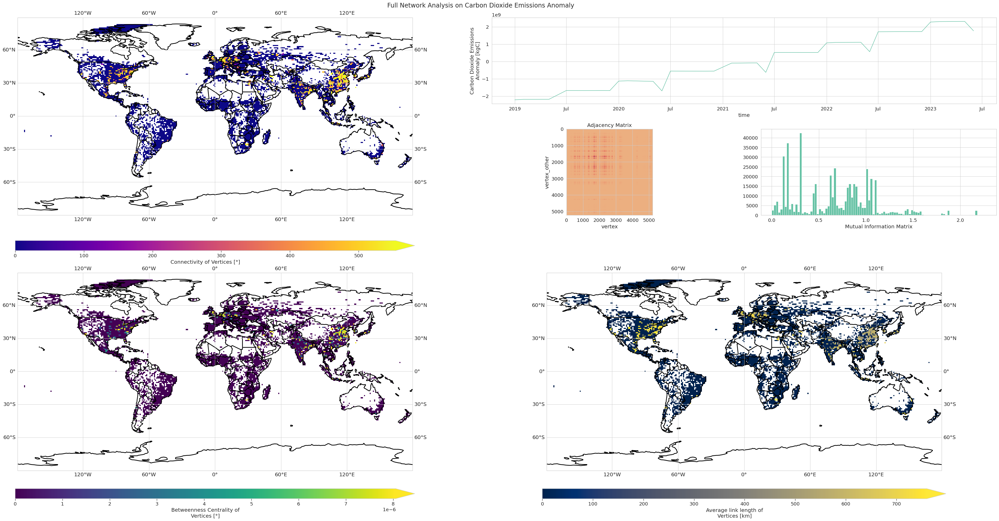

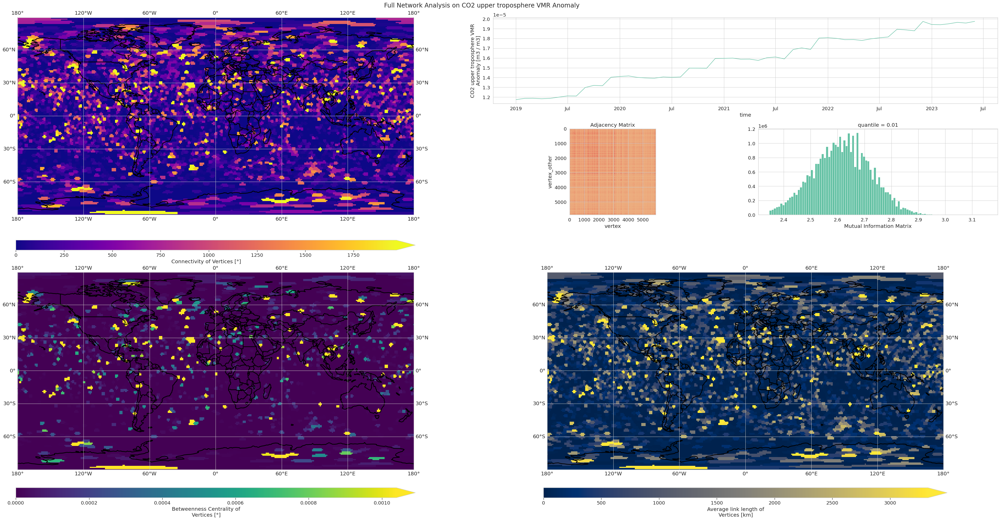

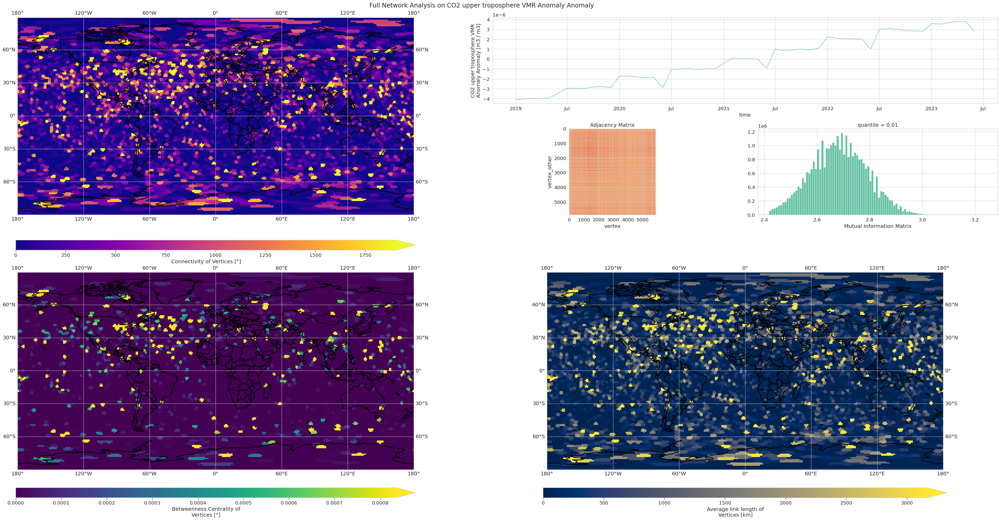

In [9]:
single_dataset(co2_graced, adj_method="mutual_information", rr=0.01);
single_dataset(co2_airs, adj_method="mutual_information", rr=0.05);
single_dataset(ch4_airs, adj_method="mutual_information", rr=0.05);

Using a threshold of 0.972808837890625 for the adjacency matrix

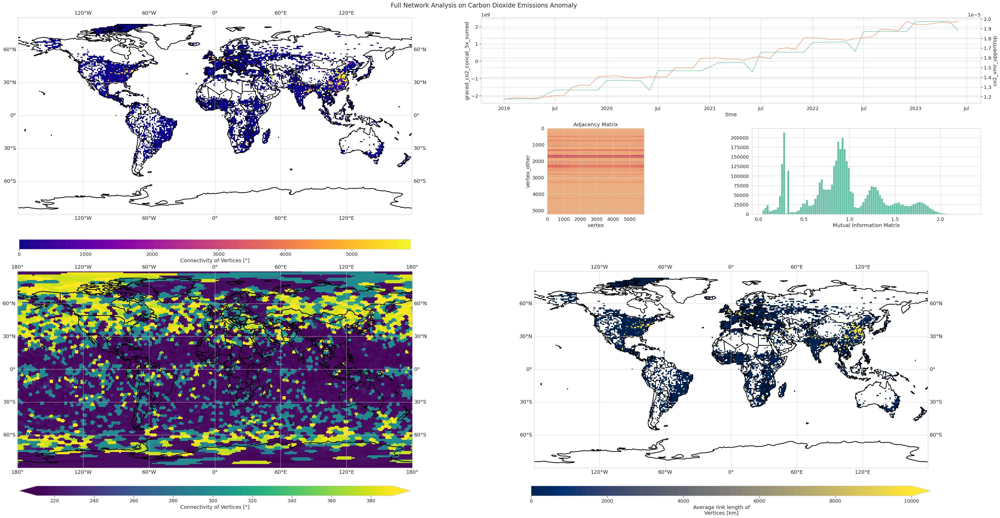

In [14]:
double_dataset(co2_graced, co2_airs, rr=0.05, adj_method="mutual_information", saveto="airs+graced-mind-hex-month");

Using a threshold of 1.4913365840911865 for the adjacency matrix

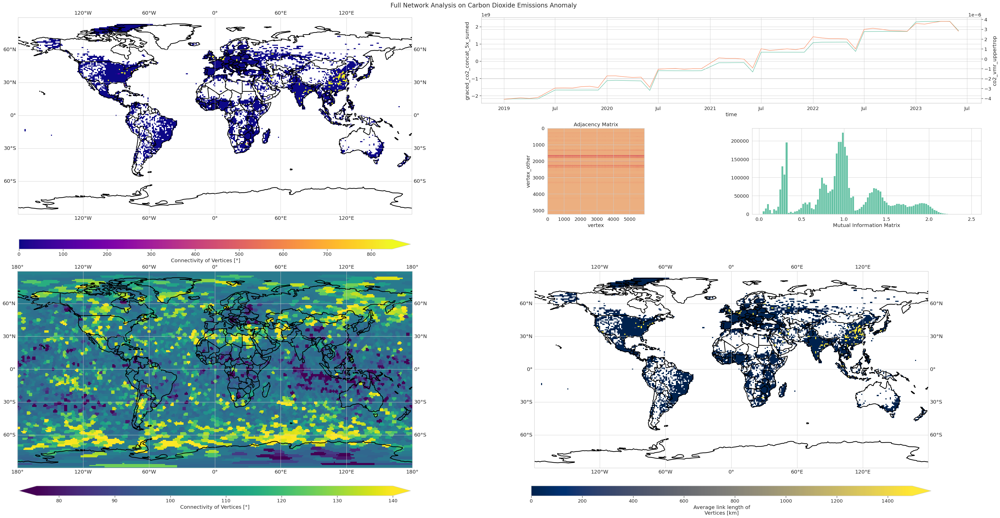

In [10]:
double_dataset(co2_graced, ch4_airs, rr=0.02, adj_method="mutual_information", saveto="airs-ch4+graced-mind-hex-month");

Loading cached data from /home/tobias/Repositories/chaotic-carbon-networks/data/aqua-airs/cache/aqua_airs_concat.nc

Loading cached data from /home/tobias/Repositories/chaotic-carbon-networks/data/aqua-airs/cache/aqua_airs_concat.nc

Using a threshold of 3.0885257720947266 for the adjacency matrix

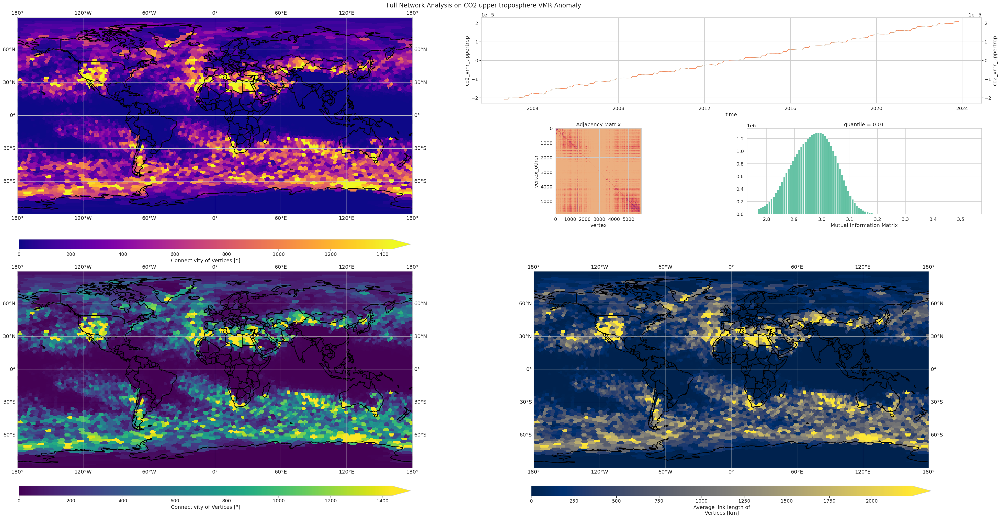

In [16]:
co2_airs = concat_airs_data()["co2_vmr_uppertrop"].sel(orbit_pass="13:30:00")
co2_airs = hexgrid(co2_airs, method="mean", hex_res=2)
co2_airs = anomaly_correction_month(co2_airs)
ch4_airs = concat_airs_data()["ch4_mmr_midtrop"].sel(orbit_pass="13:30:00")
ch4_airs = hexgrid(ch4_airs, method="mean", hex_res=2)
ch4_airs = anomaly_correction_month(co2_airs)
double_dataset(co2_airs, ch4_airs, rr=0.05, adj_method="mutual_information", saveto="airs-ch4+co2-mind-hex-month");